# CS 491 - ASSIGNMENT 2

#### Berkay Barış Turan - 28132

### Importing Libraries

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageChops
import cv2
from scipy.fft import fft2, fftshift, ifft2
from scipy import ndimage
from skimage import io
from numpy.fft import fft2, fftshift, ifft2, ifftshift

### Helper Funtions

In [ ]:
def resize_image(image, size=(100, 100)):
    # For resizing the image
    return cv2.resize(image, size)


def erode(image, kernel):
    # Morphological erosion function
    kernel_row, kernel_col = kernel.shape
    image_padded = np.pad(image, ((kernel_row // 2, kernel_row // 2), (kernel_col // 2, kernel_col // 2)), mode='constant', constant_values=0)
    result = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            x_start = i
            x_end = i + kernel_row
            y_start = j
            y_end = j + kernel_col

            reg = image_padded[x_start:x_end, y_start:y_end]
            result[i, j] = np.min(reg[kernel == 1])
    return result


def dilate(image, kernel):
    #Morphological dilation function
    kernel_row, kernel_col = kernel.shape
    padded_image = np.pad(image, ((kernel_row // 2, kernel_row // 2), (kernel_col // 2, kernel_col // 2)), mode='constant', constant_values=0)
    result = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            x_start = i
            x_end = i + kernel_row
            y_start = j
            y_end = j + kernel_col

            reg = padded_image[x_start:x_end, y_start:y_end]
            result[i, j] = np.max(reg[kernel == 1])

    return result

## Question 1

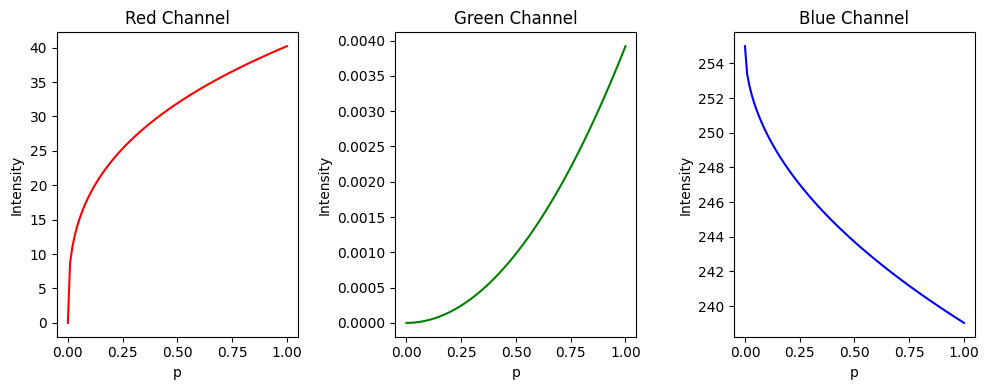

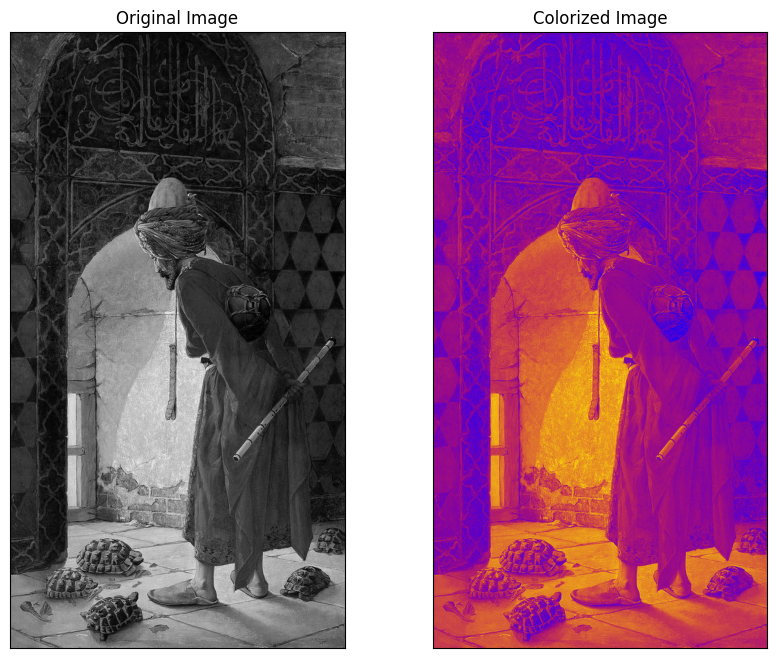

In [ ]:
def colorize_image(image_path):
    # Load image in grayscale
    image_grayscale = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image_gray_data = np.array(image_grayscale)

    # Defining the colorization functions
    # Red: increasing function
    # Green: middle range values
    # Blue: decreasing function
    red_function = lambda p: (np.clip(( p / 255) ** (1 / 3), 0 ,1) * 255)
    green_function = lambda p: (np.clip(( p / 255) ** (2), 0 ,1) * 255)
    blue_function = lambda p:  (np.clip(1 - ( p / 255) ** (1 / 2), 0 ,1) * 255)

    # Applying the colorization functions
    red_channel = (red_function(image_gray_data)).astype(np.uint8)
    green_channel = (green_function(image_gray_data)).astype(np.uint8)
    blue_channel = (blue_function(image_gray_data)).astype(np.uint8)

    # Stacking the channels to form a colorized image
    colorized_image_data = np.stack((red_channel, green_channel, blue_channel), axis=-1)

    # Converting back to an image
    colorized_image = Image.fromarray((colorized_image_data).astype(np.uint8))

    return colorized_image, red_function, green_function, blue_function


def plot_functions(red_function, green_function, blue_function):
    # Plotting the functions
    p_values = np.linspace(0, 1, 100)

    plt.figure(figsize=(10, 4))

    plt.subplot(131),plt.plot(p_values, red_function(p_values), color='red'),plt.title('Red Channel'),plt.xlabel('p'),plt.ylabel('Intensity')
    plt.subplot(132),plt.plot(p_values, green_function(p_values), color='green'),plt.title('Green Channel'),plt.xlabel('p'),plt.ylabel('Intensity')
    plt.subplot(133),plt.plot(p_values, blue_function(p_values), color='blue'),plt.title('Blue Channel'),plt.xlabel('p'),plt.ylabel('Intensity')

    plt.tight_layout()
    plt.show()

# Plotting the Original Image and Colorized Image
image_path = 'q1_kaplumbaga_terbiyecisi_osman_hamdi_bey.jpg'

colorized_image, red_fn, green_fn, blue_fn = colorize_image(image_path)

plot_functions(red_fn, green_fn, blue_fn)

# Plotting the Original Image and Colorized Image
plt.figure(figsize = (10,8))
plt.subplot(121),plt.imshow(cv2.imread(image_path),cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(colorized_image)
plt.title('Colorized Image'), plt.xticks([]), plt.yticks([])
plt.show()

## Question 2

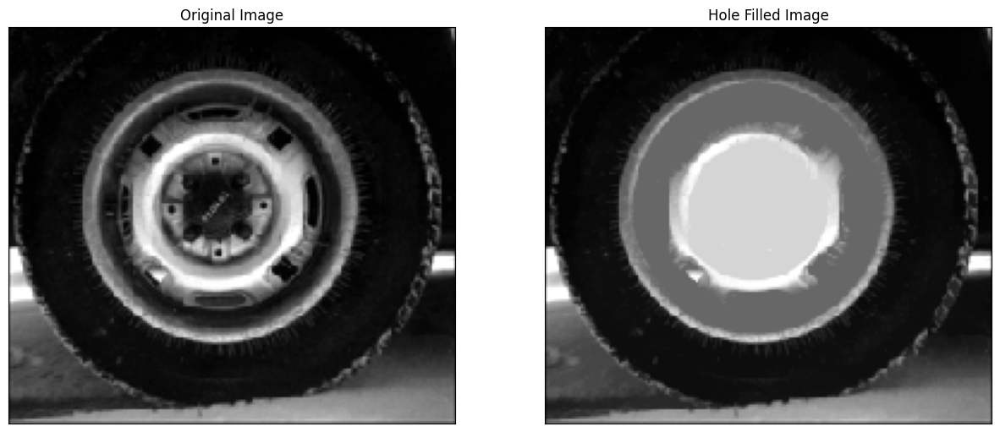

In [ ]:
def disk(radius):
    # Generates disk shaped SE with given radius
    y, x = np.ogrid[-radius:radius+1, -radius:radius+1]
    mask = x**2 + y**2 <= radius**2
    disk = mask.astype(int)
    return disk

def hole_filling(marker, mask):
    # Filling holes wtr given mask
    reconstructed = np.copy(marker)

    while True:
        se_erosion = disk(1)
        eroded_img = erode(reconstructed, se_erosion)
        reconstructed_next = np.maximum(eroded_img, mask)
        if np.array_equal(reconstructed, reconstructed_next):
            break
        reconstructed = reconstructed_next
    return reconstructed

image_path = 'q2_wheel.png'
image = io.imread(image_path)

se = disk(30)
dilated_image = dilate(image, se)
hole_filled_img = hole_filling(dilated_image, image)

plt.figure(figsize = (15,8))
plt.subplot(121),plt.imshow(image,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(hole_filled_img,cmap = 'gray')
plt.title('Hole Filled Image'), plt.xticks([]), plt.yticks([])
plt.show()

## Question 3

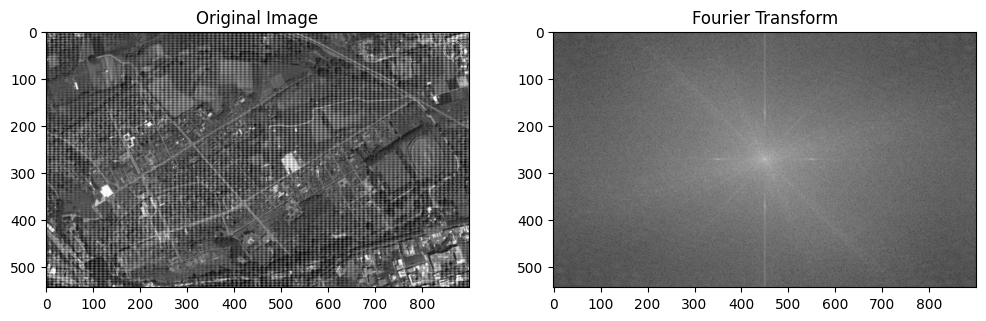

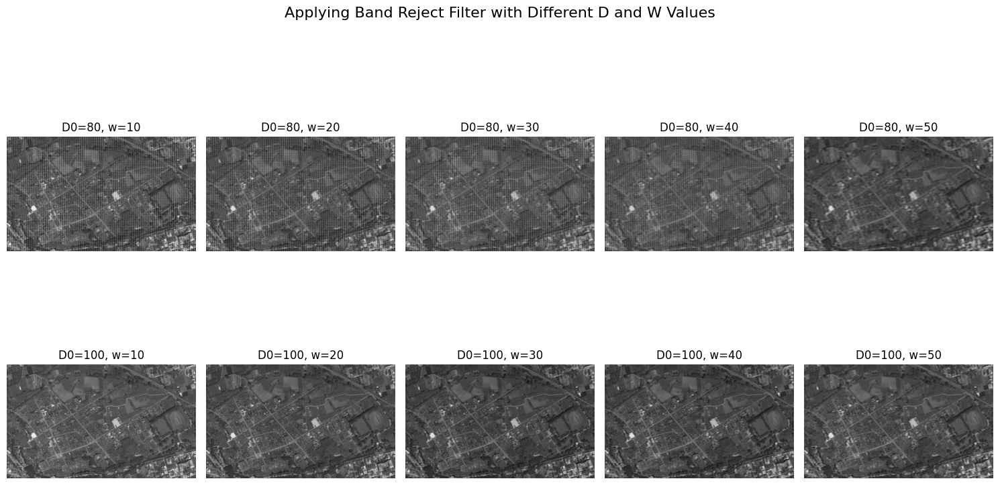

In [ ]:
def band_reject_filter(shape, d0, w):
    P, Q = shape
    H = np.ones((P, Q))
    U, V = np.meshgrid(np.arange(-Q/2, Q/2), np.arange(-P/2, P/2))
    D = np.sqrt(U**2 + V**2)
    H[(D >= d0 - w/2) & (D <= d0 + w/2)] = 0
    return H

def apply_filter(img, d0, w):
    f = fft2(img)
    f_shifted = fftshift(f)
    H = band_reject_filter(f_shifted.shape, d0, w)
    f_shifted_filtered = f_shifted * H
    f_ishift = ifftshift(f_shifted_filtered)
    img_back = ifft2(f_ishift)
    img_back = np.real(img_back)

    return img_back

image_path = 'q3_pompeii.png'
image = io.imread(image_path)

# Apply Fourier Transform
f_transform = fft2(image)
f_transform_shifted = fftshift(f_transform)

# Display the Fourier Transform
plt.figure(figsize=(12, 12))
plt.subplot(121), plt.imshow(image, cmap='gray'), plt.title('Original Image')
plt.subplot(122), plt.imshow(np.log(np.abs(f_transform_shifted) + 1), cmap='gray'), plt.title('Fourier Transform')

d0_vals = [80, 100]
w_vals = [10, 20, 30, 40, 50]
fig, axs = plt.subplots(len(d0_vals), len(w_vals), figsize=(15,9))
fig.suptitle('Applying Band Reject Filter with Different D and W Values', fontsize=16)

for i, d0 in enumerate(d0_vals):
    for j, w in enumerate(w_vals):
        img_denoised = apply_filter(image, d0, w)
        ax = axs[i, j]
        ax.imshow(img_denoised, cmap='gray')
        ax.set_title(f'D0={d0}, w={w}')
        ax.axis('off')

plt.tight_layout()
plt.show()

## Question 4

In [ ]:
def granulometry(data):
    disk_sizes = np.arange(2, 31, 2)
    def disk(n):
        # Creats disk SE's with specified n radius
        struct = np.zeros((2 * n + 1, 2 * n + 1))
        x, y = np.indices((2 * n + 1, 2 * n + 1))
        mask = (x - n)**2 + (y - n)**2 <= n**2
        struct[mask] = 1
        return struct.astype(np.uint8)

    #plt.imshow(data)
    #plt.show()
    area0=float(data.sum())
    area=np.zeros(len(disk_sizes))
    #pixel = disk_sizes
    pattern_spectrum = []
    pixel = []
    for n in range(len(disk_sizes)):
        kernel = disk(disk_sizes[n])
        #print('binary opening the data with radius =',((kernel.shape[0])//2)+1,' [pixels]')
        opened_data = erode(data, kernel)
        opened_data = dilate(opened_data, kernel)

        #plt.imshow(opened_data)
        #plt.show()

        area = np.sum(opened_data / 255)
        pixel.append(((kernel.shape[0])//2)+1)
        pattern_spectrum.append(area)

    return area, pattern_spectrum, pixel

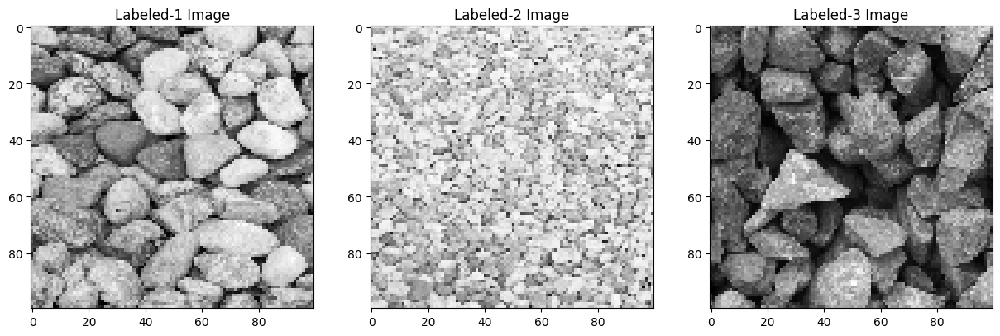

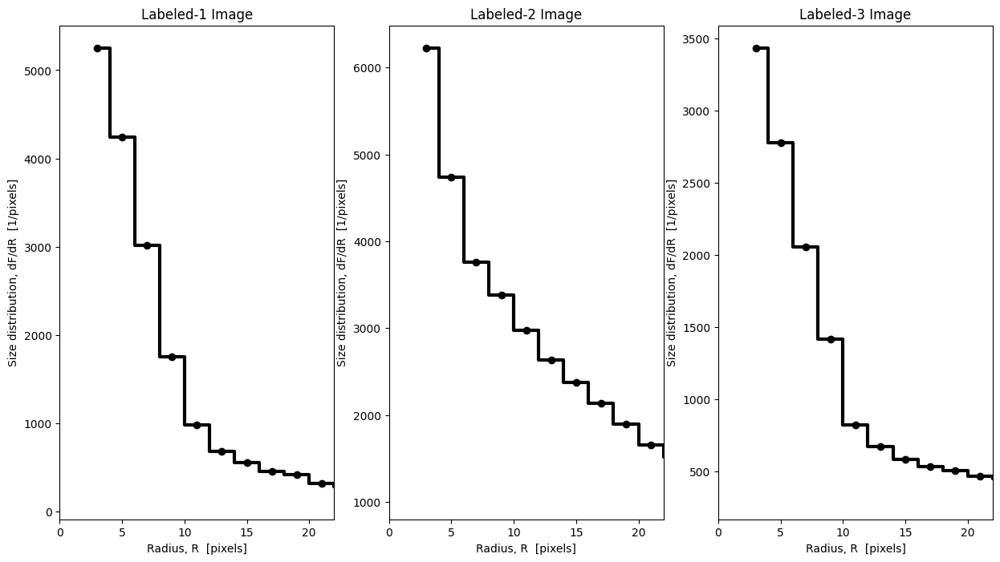

In [ ]:
# Load the images
image_path1 = 'labeled-1.jpg'
image_path2 = 'labeled-2.jpg'
image_path3 = 'labeled-3.jpg'
image1 = cv2.imread(image_path1, cv2.IMREAD_GRAYSCALE)
image1 = resize_image(image1)
image2 = cv2.imread(image_path2, cv2.IMREAD_GRAYSCALE)
image2 = resize_image(image2)
image3 = cv2.imread(image_path3, cv2.IMREAD_GRAYSCALE)
image3 = resize_image(image3)

# Plot the images
plt.figure(figsize=(15, 8))
plt.subplot(131), plt.imshow(image1, cmap='gray')
plt.title('Labeled-1 Image')
plt.subplot(132), plt.imshow(image2, cmap='gray')
plt.title('Labeled-2 Image')
plt.subplot(133), plt.imshow(image3, cmap='gray')
plt.title('Labeled-3 Image')
plt.show()

# Calculate Granulometry of labeled images
area_1,dFdR_1,pixel_1=granulometry(image1)
area_2,dFdR_2,pixel_2=granulometry(image2)
area_3,dFdR_3,pixel_3=granulometry(image3)

# Plotting Pattern Spectrum
plt.figure(figsize=(15, 8))
plt.subplot(131), plt.plot(pixel_1, dFdR_1, 'ko-',linewidth=3,drawstyle='steps-mid'),plt.xlabel('Radius, R  [pixels]'),plt.ylabel('Size distribution, dF/dR  [1/pixels]'), plt.xlim(0,22)
plt.title('Labeled-1 Image')
plt.subplot(132), plt.plot(pixel_2, dFdR_2, 'ko-',linewidth=3,drawstyle='steps-mid'),plt.xlabel('Radius, R  [pixels]'),plt.ylabel('Size distribution, dF/dR  [1/pixels]'), plt.xlim(0,22)
plt.title('Labeled-2 Image')
plt.subplot(133),plt.plot(pixel_3, dFdR_3, 'ko-',linewidth=3,drawstyle='steps-mid'),plt.xlabel('Radius, R  [pixels]'),plt.ylabel('Size distribution, dF/dR  [1/pixels]'), plt.xlim(0,22)
plt.title('Labeled-3 Image')
plt.show()


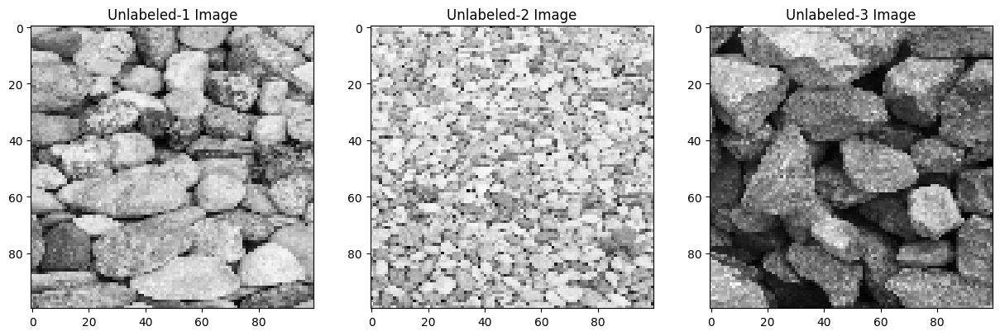

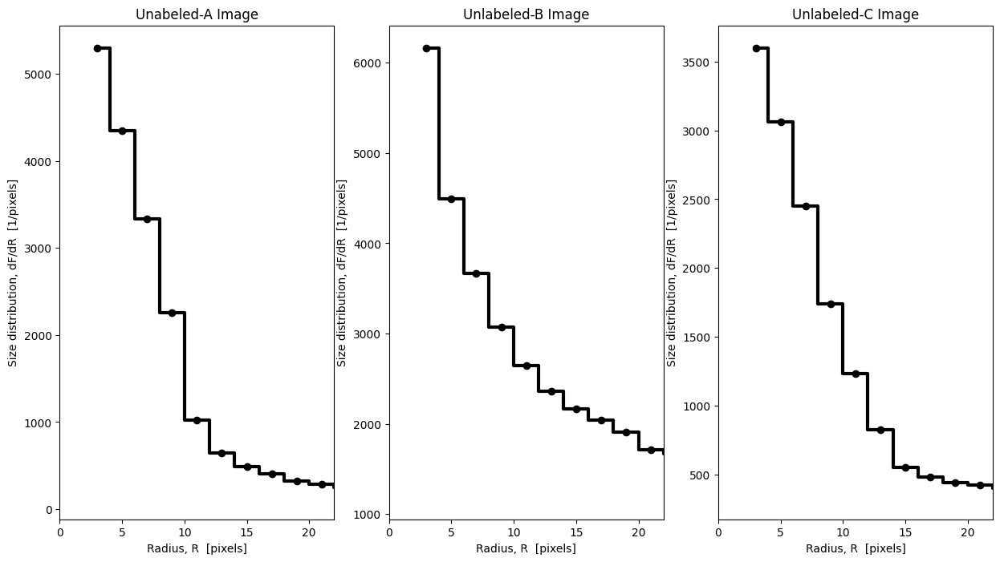

In [ ]:
# Load the images
image_path1 = 'unlabeled-A.jpg'
image_path2 = 'unlabeled-B.jpg'
image_path3 = 'unlabeled-C.jpg'
image1_unlabeled = cv2.imread(image_path1, cv2.IMREAD_GRAYSCALE)
image1_unlabeled = resize_image(image1_unlabeled)
image2_unlabeled = cv2.imread(image_path2, cv2.IMREAD_GRAYSCALE)
image2_unlabeled = resize_image(image2_unlabeled)
image3_unlabeled = cv2.imread(image_path3, cv2.IMREAD_GRAYSCALE)
image3_unlabeled = resize_image(image3_unlabeled)

# Plot the images
plt.figure(figsize=(15, 8))
plt.subplot(131), plt.imshow(image1_unlabeled, cmap='gray')
plt.title('Unlabeled-1 Image')
plt.subplot(132), plt.imshow(image2_unlabeled, cmap='gray')
plt.title('Unlabeled-2 Image')
plt.subplot(133), plt.imshow(image3_unlabeled, cmap='gray')
plt.title('Unlabeled-3 Image')
plt.show()

# Calculate Granulometry of labeled images
area_1_UL,dFdR_1_UL,pixel_1_UL=granulometry(image1_unlabeled)
area_2_UL,dFdR_2_UL,pixel_2_UL=granulometry(image2_unlabeled)
area_3_UL,dFdR_3_UL,pixel_3_UL=granulometry(image3_unlabeled)

# Plotting Pattern Spectrum
plt.figure(figsize=(15, 8))
plt.subplot(131), plt.plot(pixel_1_UL, dFdR_1_UL, 'ko-',linewidth=3,drawstyle='steps-mid'),plt.xlabel('Radius, R  [pixels]'),plt.ylabel('Size distribution, dF/dR  [1/pixels]'), plt.xlim(0,22)
plt.title('Unabeled-A Image')
plt.subplot(132), plt.plot(pixel_2_UL, dFdR_2_UL, 'ko-',linewidth=3,drawstyle='steps-mid'),plt.xlabel('Radius, R  [pixels]'),plt.ylabel('Size distribution, dF/dR  [1/pixels]'), plt.xlim(0,22)
plt.title('Unlabeled-B Image')
plt.subplot(133),plt.plot(pixel_3_UL, dFdR_3_UL, 'ko-',linewidth=3,drawstyle='steps-mid'),plt.xlabel('Radius, R  [pixels]'),plt.ylabel('Size distribution, dF/dR  [1/pixels]'), plt.xlim(0,22)
plt.title('Unlabeled-C Image')
plt.show()

In [ ]:
def labeler(unlabeled_dist, label1_dist, label2_dist, label3_dist):
  # Labels an unlabled grain type by taking the one that has the minimum distance
  difference1 = 0
  difference2 = 0
  difference3 = 0
  for i in range(len(unlabeled_dist)):
    difference1 += abs(unlabeled_dist[i] - label1_dist[i])
    difference2 += abs(unlabeled_dist[i] - label2_dist[i])
    difference3 += abs(unlabeled_dist[i] - label3_dist[i])

  minimum_difference = min(difference1, difference2, difference3)

  if minimum_difference == difference1:
    print("This is label-1")
  elif minimum_difference == difference2:
    print("This is label-2")
  elif minimum_difference == difference3:
    print("This is label-3")
  else:
    print("Something is wrong")
print("Unlabeled A")
labeler(dFdR_1_UL, dFdR_1,dFdR_2,dFdR_3)
print("--------------------------------")
print("Unlabeled B")
labeler(dFdR_2_UL, dFdR_1,dFdR_2,dFdR_3)
print("--------------------------------")
print("Unlabeled C")
labeler(dFdR_3_UL, dFdR_1,dFdR_2,dFdR_3)

Unlabeled A
This is label-1
--------------------------------
Unlabeled B
This is label-2
--------------------------------
Unlabeled C
This is label-3


## Question 5

In [ ]:
def marginal_median_filter(image, kernel_size):
    pad_width = kernel_size // 2
    padded_image = np.pad(image, [(pad_width, pad_width), (pad_width, pad_width), (0, 0)], mode='reflect')
    filtered_image = np.zeros_like(image)

    for channel in range(image.shape[2]):
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                neighborhood = padded_image[i:i+kernel_size, j:j+kernel_size, channel]
                filtered_image[i, j, channel] = np.median(neighborhood)

    return filtered_image


def lexicographical_median_filter(image, kernel_size):
    pad_width = kernel_size // 2
    padded_image = np.pad(image, [(pad_width, pad_width), (pad_width, pad_width), (0, 0)], mode='reflect')
    filtered_image = np.zeros_like(image)

    for i in range(pad_width, padded_image.shape[0] - pad_width):
        for j in range(pad_width, padded_image.shape[1] - pad_width):
            neighborhood = padded_image[i-pad_width:i+pad_width+1, j-pad_width:j+pad_width+1, :]
            flat_neighborhood = neighborhood.reshape(-1, 3)
            sorted_neighborhood = sorted(flat_neighborhood, key=lambda k: (k[0], k[1], k[2]))
            median_pixel = sorted_neighborhood[len(sorted_neighborhood) // 2]
            filtered_image[i-pad_width, j-pad_width] = median_pixel

    return filtered_image

def bitmix_median_filter(image, kernel_size):
    pad_size = kernel_size // 2
    padded_image = np.pad(image, ((pad_size, pad_size), (pad_size, pad_size), (0, 0)), mode='constant', constant_values=0)
    filtered_image = np.zeros_like(image)

    def bitmix(pixel):
        return (pixel[0] << 16) + (pixel[1] << 8) + pixel[2]

    def reverse_bitmix(value):
        return [value >> 16 & 255, value >> 8 & 255, value & 255]

    for i in range(pad_size, padded_image.shape[0] - pad_size):
        for j in range(pad_size, padded_image.shape[1] - pad_size):
            neighborhood = padded_image[i - pad_size:i + pad_size + 1, j - pad_size:j + pad_size + 1, :]
            flattened = neighborhood.reshape(-1, neighborhood.shape[-1])
            bitmixed_values = list(map(bitmix, flattened))
            sorted_values = sorted(bitmixed_values)

            median_index = (len(sorted_values) - 1) // 2
            median_value = sorted_values[median_index]
            filtered_image[i - pad_size, j - pad_size] = reverse_bitmix(median_value)

    return filtered_image


def norm_median_filter(image, kernel_size):
    pad_width = kernel_size // 2
    padded_image = np.pad(image, [(pad_width, pad_width), (pad_width, pad_width), (0, 0)], mode='reflect')
    filtered_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            neighborhood = padded_image[i:i+kernel_size, j:j+kernel_size, :].reshape(-1, 3)
            norms = np.linalg.norm(neighborhood, axis=1)
            median_pixel = neighborhood[np.argsort(norms)[len(norms) // 2]]
            filtered_image[i, j, :] = median_pixel

    return filtered_image

def mse(data1, data2):
    error = np.sum((data1.astype("float") - data2.astype("float")) ** 2)
    error /= float(data1.shape[0] * data1.shape[1])
    return error

def is_24bit_rgb(image_path):
    try:
        with Image.open(image_path) as img:
            # Check if image mode is RGB
            if img.mode == 'RGB':
                print(f"{image_path} is a 24-bit RGB image.")
                return True
            else:
                print(f"{image_path} is not a 24-bit RGB image. Image mode is {img.mode}.")
                return False
    except IOError:
        print(f"Error in opening {image_path}. It may not be an image file.")
        return False

#### Checking whether the images are 24-bit RGB images or not

In [ ]:
paths = ["animal.jpeg", "baloon.jpeg", "banana.jpeg", "butterfly.png", "man.png", "cat.jpeg", "mouse.jpeg","veg.jpeg", "train.jpg", "parrot.png"]

for path in paths:
  is_24bit_rgb(path)

animal.jpeg is a 24-bit RGB image.
baloon.jpeg is a 24-bit RGB image.
banana.jpeg is a 24-bit RGB image.
butterfly.png is a 24-bit RGB image.
man.png is a 24-bit RGB image.
cat.jpeg is a 24-bit RGB image.
mouse.jpeg is a 24-bit RGB image.
veg.jpeg is a 24-bit RGB image.
train.jpg is a 24-bit RGB image.
parrot.png is a 24-bit RGB image.


#### Filtering with Kernel Size = 3

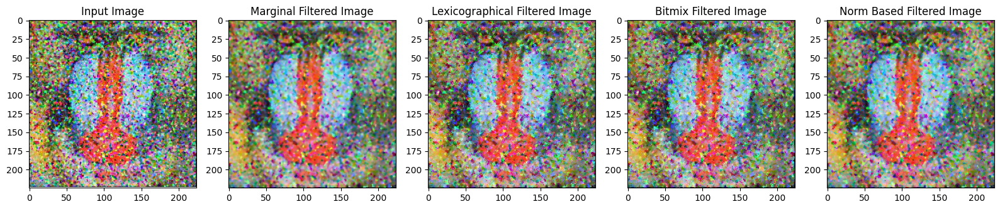

MSE for Marginal Median Filter: 3315.980892857143
MSE for Lexicographical Median Filter: 5568.578412698413
MSE for Bitmix Median Filter: 5662.819186507936
MSE for Norm Median Filter: 5031.84748015873


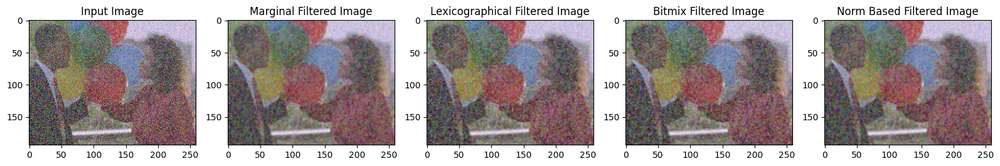

MSE for Marginal Median Filter: 2513.778251005055
MSE for Lexicographical Median Filter: 3355.4406519921986
MSE for Bitmix Median Filter: 3367.2773952155394
MSE for Norm Median Filter: 3038.0281216415237


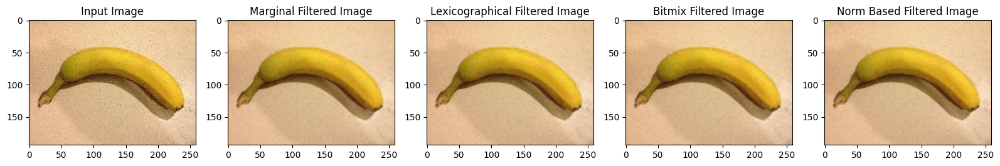

MSE for Marginal Median Filter: 211.19165704732714
MSE for Lexicographical Median Filter: 219.39270787724396
MSE for Bitmix Median Filter: 228.07138876726506
MSE for Norm Median Filter: 216.69380647215698


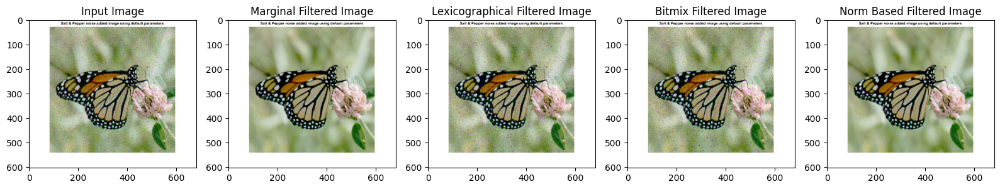

MSE for Marginal Median Filter: 2295.9167286733486
MSE for Lexicographical Median Filter: 3048.5236987107473
MSE for Bitmix Median Filter: 3050.4211031839823
MSE for Norm Median Filter: 2385.389017765522


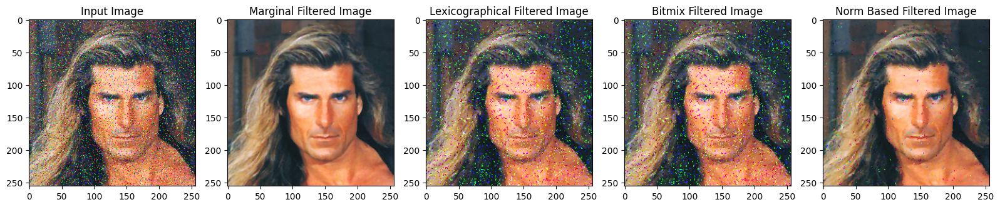

MSE for Marginal Median Filter: 6040.466354370117
MSE for Lexicographical Median Filter: 8314.848907470703
MSE for Bitmix Median Filter: 8297.738189697266
MSE for Norm Median Filter: 6600.698348999023


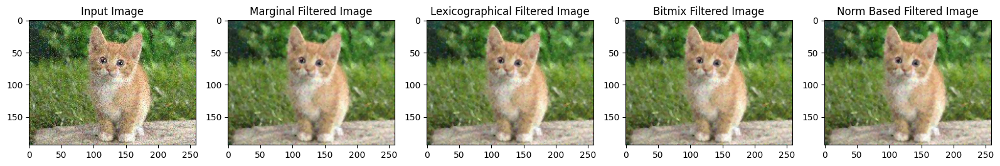

MSE for Marginal Median Filter: 1159.0214146399715
MSE for Lexicographical Median Filter: 1188.7344266210246
MSE for Bitmix Median Filter: 1199.6052820124985
MSE for Norm Median Filter: 1177.3475500537356


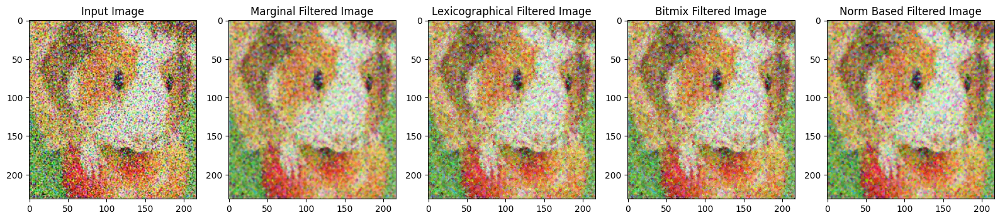

MSE for Marginal Median Filter: 2834.2797354203085
MSE for Lexicographical Median Filter: 4301.378138407755
MSE for Bitmix Median Filter: 4415.560285237566
MSE for Norm Median Filter: 3839.544831558875


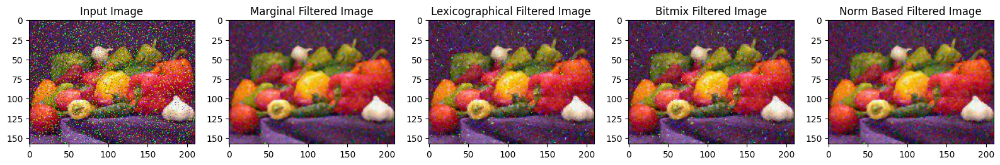

MSE for Marginal Median Filter: 3824.9357142857143
MSE for Lexicographical Median Filter: 5301.158890898131
MSE for Bitmix Median Filter: 5326.150723327306
MSE for Norm Median Filter: 4859.883845690175


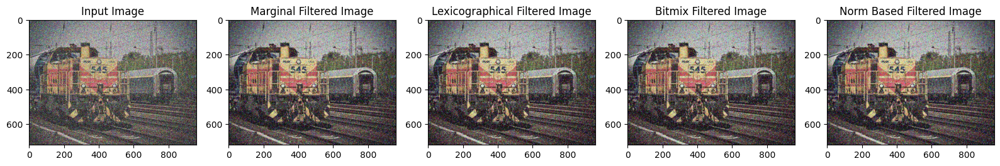

MSE for Marginal Median Filter: 11683.789814814814
MSE for Lexicographical Median Filter: 13289.15882667824
MSE for Bitmix Median Filter: 13301.252954282407
MSE for Norm Median Filter: 12618.242651909723


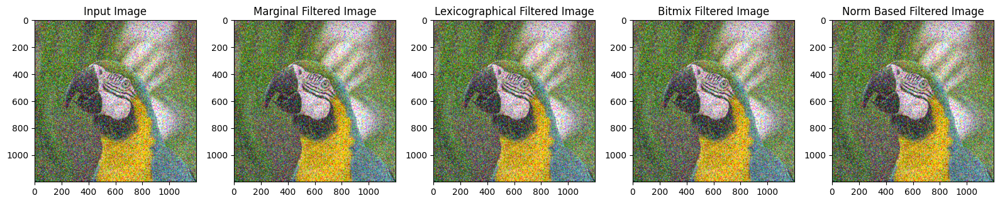

MSE for Marginal Median Filter: 293.4547263888889
MSE for Lexicographical Median Filter: 1353.1093659722221
MSE for Bitmix Median Filter: 1358.0157027777777
MSE for Norm Median Filter: 1193.9983486111112


In [ ]:
for path in paths:
    image = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    kernel_size = 3

    filtered_image_marginal = marginal_median_filter(image, kernel_size)
    mse_marginal = mse(image, filtered_image_marginal)

    filtered_image_lex = lexicographical_median_filter(image, kernel_size)
    mse_lex = mse(image, filtered_image_lex)

    filtered_image_bitmix = bitmix_median_filter(image, kernel_size)
    mse_bitmix = mse(image, filtered_image_bitmix)

    filtered_image_norm = norm_median_filter(image, kernel_size)
    mse_norm = mse(image, filtered_image_norm)

    # Display the results
    plt.figure(figsize=(16, 20))

    plt.subplot(151), plt.imshow(image), plt.title('Input Image')
    plt.subplot(152), plt.imshow(filtered_image_marginal), plt.title('Marginal Filtered Image')
    plt.subplot(153), plt.imshow(filtered_image_lex), plt.title('Lexicographical Filtered Image')
    plt.subplot(154), plt.imshow(filtered_image_bitmix), plt.title('Bitmix Filtered Image')
    plt.subplot(155), plt.imshow(filtered_image_norm), plt.title('Norm Based Filtered Image')

    plt.tight_layout()
    plt.show()

    # Display MSE values
    print(f"MSE for Marginal Median Filter: {mse_marginal}")
    print(f"MSE for Lexicographical Median Filter: {mse_lex}")
    print(f"MSE for Bitmix Median Filter: {mse_bitmix}")
    print(f"MSE for Norm Median Filter: {mse_norm}")

#### Filterin with Kernel Size = 5

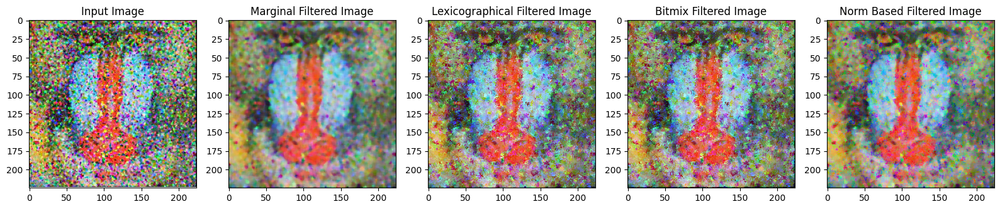

MSE for Marginal Median Filter: 5513.660178571428
MSE for Lexicographical Median Filter: 9065.046984126984
MSE for Bitmix Median Filter: 9356.806567460317
MSE for Norm Median Filter: 8222.959424603174


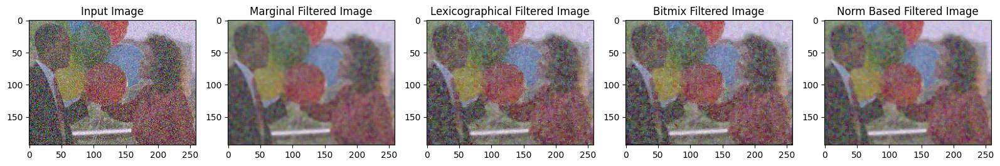

MSE for Marginal Median Filter: 2972.7992676033914
MSE for Lexicographical Median Filter: 4176.087250726426
MSE for Bitmix Median Filter: 4227.3921108147915
MSE for Norm Median Filter: 3712.3400071647493


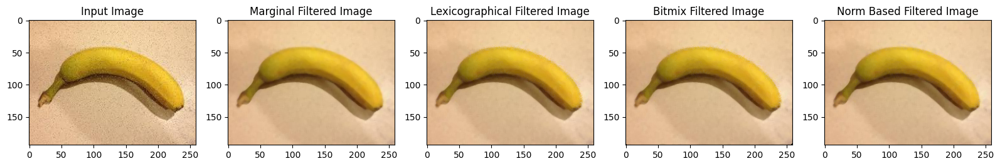

MSE for Marginal Median Filter: 245.8699398957131
MSE for Lexicographical Median Filter: 264.9250487601003
MSE for Bitmix Median Filter: 291.5485809815707
MSE for Norm Median Filter: 257.70041396330055


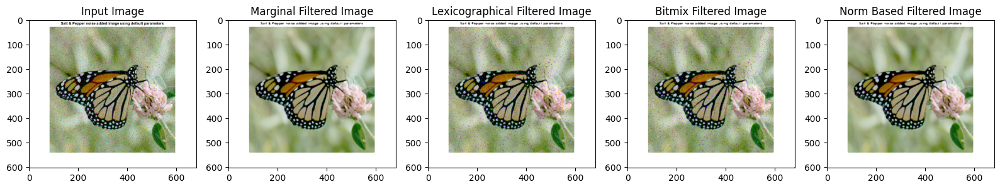

MSE for Marginal Median Filter: 2709.678464957714
MSE for Lexicographical Median Filter: 3952.961169227178
MSE for Bitmix Median Filter: 3958.653382646883
MSE for Norm Median Filter: 2860.137365469816


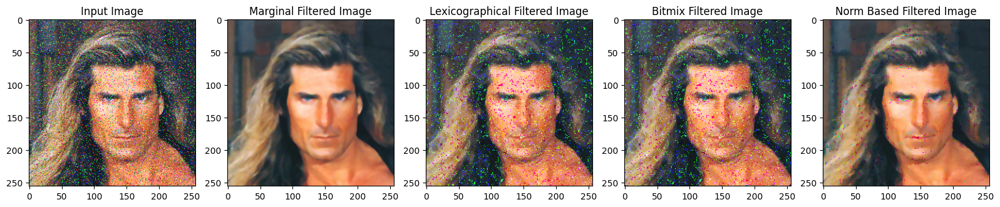

MSE for Marginal Median Filter: 6256.389587402344
MSE for Lexicographical Median Filter: 9552.374404907227
MSE for Bitmix Median Filter: 9592.158706665039
MSE for Norm Median Filter: 6908.961639404297


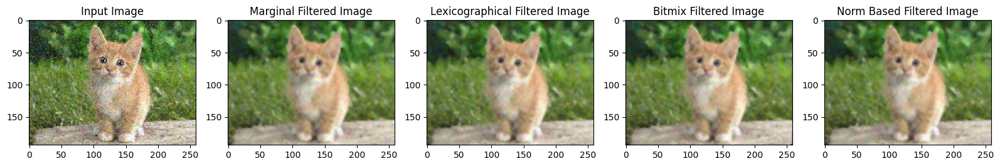

MSE for Marginal Median Filter: 1336.5347291326673
MSE for Lexicographical Median Filter: 1401.9218843291007
MSE for Bitmix Median Filter: 1437.8669545834493
MSE for Norm Median Filter: 1375.4057238387136


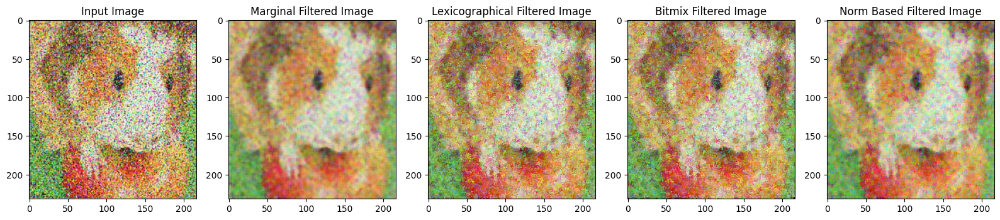

MSE for Marginal Median Filter: 4491.934411250596
MSE for Lexicographical Median Filter: 6723.910654695694
MSE for Bitmix Median Filter: 6919.125814396949
MSE for Norm Median Filter: 6036.247815032576


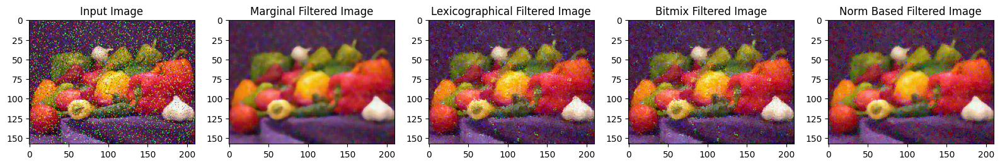

MSE for Marginal Median Filter: 5085.045388788427
MSE for Lexicographical Median Filter: 7010.514948764316
MSE for Bitmix Median Filter: 7072.450994575045
MSE for Norm Median Filter: 6550.065641952984


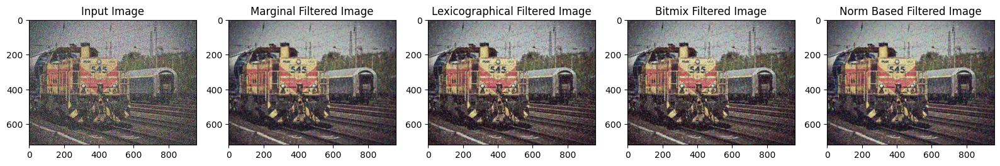

MSE for Marginal Median Filter: 12795.275245949075
MSE for Lexicographical Median Filter: 15186.909888599537
MSE for Bitmix Median Filter: 15230.916740451388
MSE for Norm Median Filter: 14258.885983796295


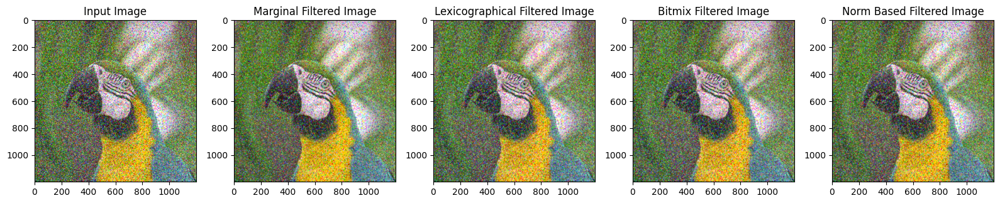

MSE for Marginal Median Filter: 1583.5410055555556
MSE for Lexicographical Median Filter: 4027.864342361111
MSE for Bitmix Median Filter: 4044.4060597222224
MSE for Norm Median Filter: 3620.968804861111


In [ ]:
for path in paths:
    image = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    kernel_size = 5

    filtered_image_marginal = marginal_median_filter(image, kernel_size)
    mse_marginal = mse(image, filtered_image_marginal)

    filtered_image_lex = lexicographical_median_filter(image, kernel_size)
    mse_lex = mse(image, filtered_image_lex)

    filtered_image_bitmix = bitmix_median_filter(image, kernel_size)
    mse_bitmix = mse(image, filtered_image_bitmix)

    filtered_image_norm = norm_median_filter(image, kernel_size)
    mse_norm = mse(image, filtered_image_norm)

    # Display the results
    plt.figure(figsize=(16, 20))

    plt.subplot(151), plt.imshow(image), plt.title('Input Image')
    plt.subplot(152), plt.imshow(filtered_image_marginal), plt.title('Marginal Filtered Image')
    plt.subplot(153), plt.imshow(filtered_image_lex), plt.title('Lexicographical Filtered Image')
    plt.subplot(154), plt.imshow(filtered_image_bitmix), plt.title('Bitmix Filtered Image')
    plt.subplot(155), plt.imshow(filtered_image_norm), plt.title('Norm Based Filtered Image')

    plt.tight_layout()
    plt.show()

    # Display MSe values
    print(f"MSE for Marginal Median Filter: {mse_marginal}")
    print(f"MSE for Lexicographical Median Filter: {mse_lex}")
    print(f"MSE for Bitmix Median Filter: {mse_bitmix}")
    print(f"MSE for Norm Median Filter: {mse_norm}")